In [1]:
import os
os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1
os.environ["CUDA_VISIBLE_DEVICES"]= '3'

import numpy as np
import matplotlib.pyplot as plt
import multielec_src.fitting as fitting
import multielec_src.multielec_utils as mutils
from scipy.io import loadmat
import multiprocessing as mp
import statsmodels.api as sm
from copy import deepcopy, copy
import visionloader as vl
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def sample_spikes(p_true, t):
    p_true, t = np.array(p_true), np.array(t).astype(int)
    
    p_empirical = []
    for i in range(len(p_true)):
        if t[i] == 0:
            p_empirical += [0.5]
        
        else:
            p_empirical += [np.mean(np.random.choice(np.array([0, 1]), 
                                                 p=np.array([1-p_true[i], p_true[i]]), 
                                                 size=t[i]))]
        
    p_empirical_array = np.array(p_empirical)

    return p_empirical_array

In [3]:
def sample_spikes_array(true_probs, trials, NUM_THREADS=24):

    input_list = []
    for i in range(len(true_probs)):
        for j in range(len(true_probs[i])):
            input_list += [(true_probs[i][j], trials[j])]
            
    pool = mp.Pool(processes=NUM_THREADS)
    results = pool.starmap_async(sample_spikes, input_list)
    mp_output = results.get()
    pool.close()

    return np.array(mp_output).reshape(true_probs.shape)
    

In [4]:
def get_performance_array(true_params, curr_probs, true_probs):
    
    error = 0
    cnt = 0
    for i in range(len(true_params)):
        for j in range(len(true_params[i])):
            if ~np.all(true_params[i][j][:, 0] == -np.inf):
                error += np.sqrt(np.sum((curr_probs[i][j] - true_probs[i][j])**2) / len(true_probs[i][j]))
                cnt += 1

    return error / cnt

In [5]:
GSORT_BASE = "/Volumes/Scratch/Analysis"
ANALYSIS_BASE = "/Volumes/Analysis"
dataset = "2020-10-18-0"
wnoise = "kilosort_data000/data000"
spont_limit = 0.2
min_active_inds = 200

estim_neg = "data003/data003-all"

outpath = os.path.join(GSORT_BASE, dataset, estim_neg, wnoise)
electrical_path = os.path.join(ANALYSIS_BASE, dataset, estim_neg)
parameters = loadmat(os.path.join(outpath, 'parameters.mat'))

cells = parameters['cells'].flatten()
num_cells = len(cells)
num_patterns = max(parameters['patterns'].flatten())
num_movies = parameters['movies'].flatten()[0]

all_probs = np.nan_to_num(np.array(np.memmap(os.path.join(outpath, 'init_probs.dat'),
                                            mode='r',shape=(num_cells, num_patterns, num_movies), dtype='float32')))
trials = np.array(np.memmap(os.path.join(outpath, 'trial.dat'),mode='r',shape=(num_patterns, num_movies), dtype='int16'), dtype=int)
amps = np.array([mutils.get_stim_amps_newlv(electrical_path, 1)] * len(trials))

clean_inds_array = np.full((all_probs.shape[0], all_probs.shape[1]), 
                            None, dtype=object)

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if np.count_nonzero(all_probs[i][j] >= spont_limit) >= min_active_inds:
            print(cells[i], j+1)
            clean_inds = mutils.triplet_cleaning(amps[j], all_probs[i][j], trials[j],
                                                 return_inds=True)
            above_spont = np.where(all_probs[i][j][clean_inds] >= spont_limit)[0]
            if len(above_spont) >= min_active_inds:
                clean_inds_array[i][j] = clean_inds

3 2
6 2
11 2
12 2
14 2
72 3
74 3
75 3
81 3
85 1
85 3
89 1
90 1
107 1
292 2


In [6]:
ms = [1, 2, 3, 4, 5, 6]

w_inits_array = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
for i in range(len(w_inits_array)):
    for j in range(len(w_inits_array[i])):
        w_inits = []

        for m in ms:
            w_init = np.array(np.random.normal(size=(m, amps[j].shape[1]+1)))
            w_inits.append(w_init)

        w_inits_array[i][j] = w_inits

In [7]:
input_list = fitting.generate_input_list(all_probs, amps, trials, w_inits_array, spont_limit,
                                         pass_inds=clean_inds_array)

pool = mp.Pool(processes=48)
results = pool.starmap_async(fitting.fit_surface, input_list)
mp_output = results.get()
pool.close()

In [8]:
params_true = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
inits = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
R2s = np.zeros((all_probs.shape[0], all_probs.shape[1]))

amps_scan = np.array([np.array(np.meshgrid(np.linspace(-2, 2, 21), 
                                np.linspace(-2, 2, 21),
                                np.linspace(-2, 2, 21))).T.reshape(-1,3)] * len(trials))
probs_true_scan = np.zeros((all_probs.shape[0], all_probs.shape[1], amps_scan.shape[1]))

cnt = 0
for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        params_true[i][j] = mp_output[cnt][0]
        inits[i][j] = mp_output[cnt][1]
        R2s[i][j] = mp_output[cnt][2]
        
        probs_true_scan[i][j] = fitting.sigmoidND_nonlinear(
                                sm.add_constant(amps_scan[j], has_constant='add'), 
                                params_true[i][j])
        

        cnt += 1

6 2
[[-9.75079214  1.78470369  1.51253399  6.56807978]
 [-8.87068147 -1.76451543 -1.47130969 -7.32618583]]
850


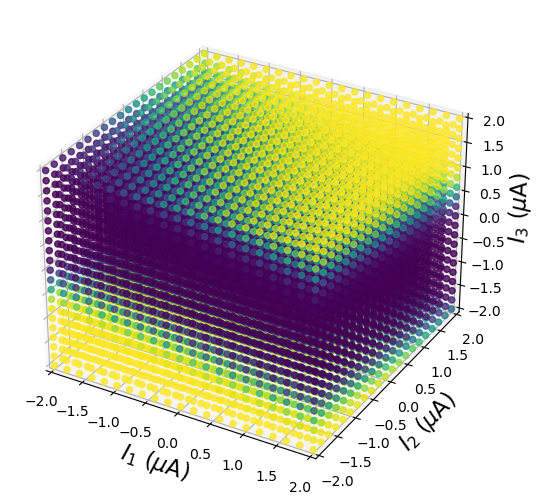

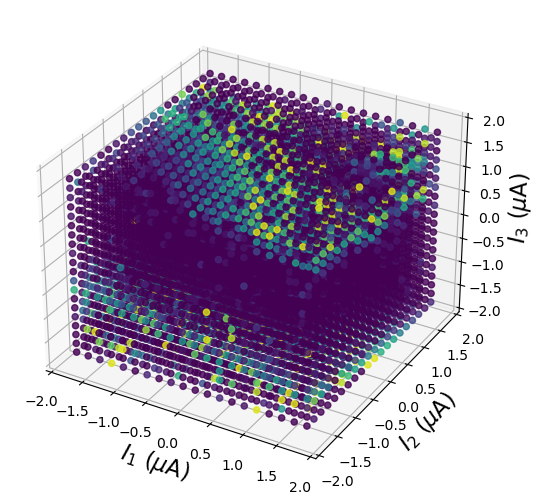

11 2
[[-6.0254969   0.80747044  3.03411444  2.86427946]
 [-5.58714591 -1.11028675 -3.0602115  -3.08503907]]
884


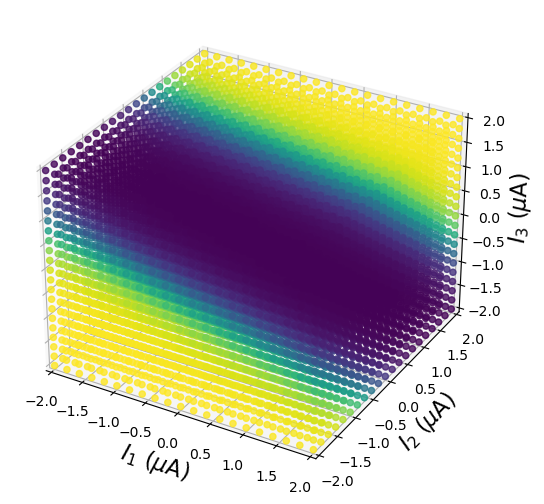

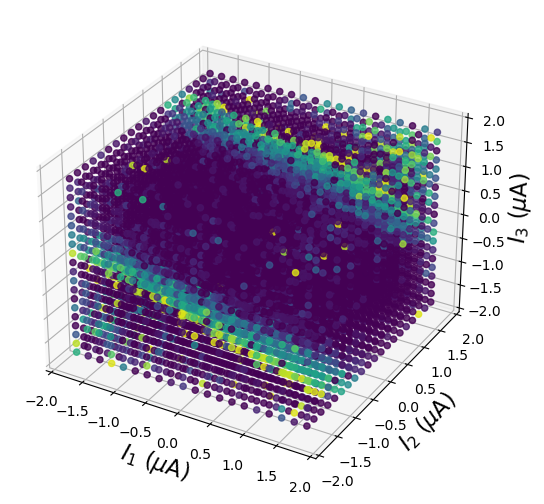

12 2
[[ -7.65816189  -2.08948953  -3.76333328 -10.        ]
 [ -9.08647535   2.21137428   4.07801083  10.        ]]
526


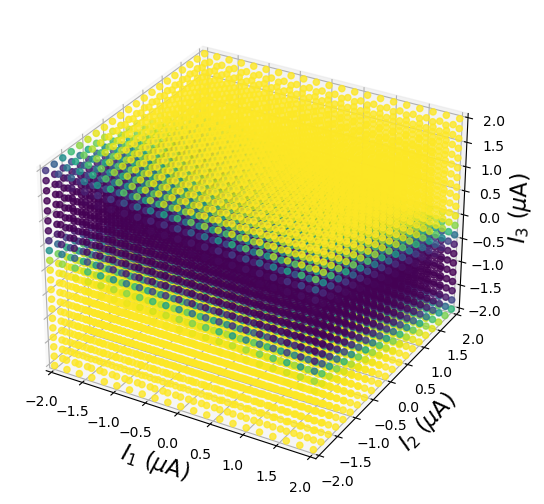

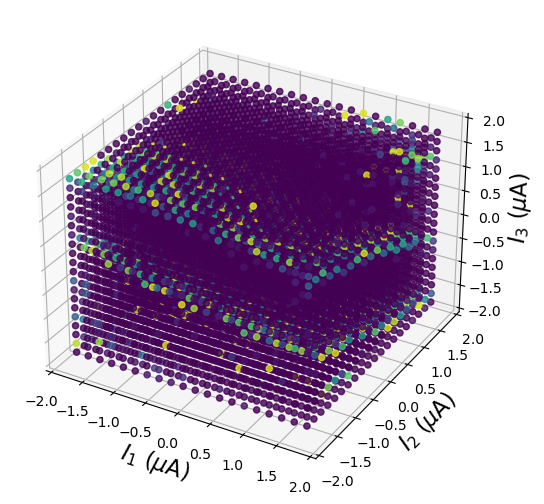

72 3
[[-7.61716716  3.36021418  2.15545974  2.44248064]
 [-7.74667017 -3.46224511 -2.15600536 -2.74424297]]
656


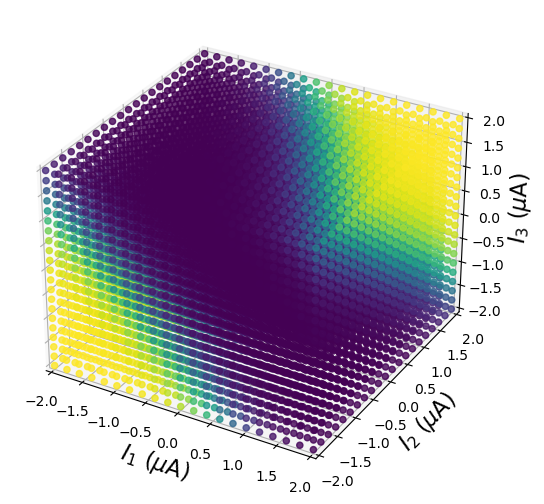

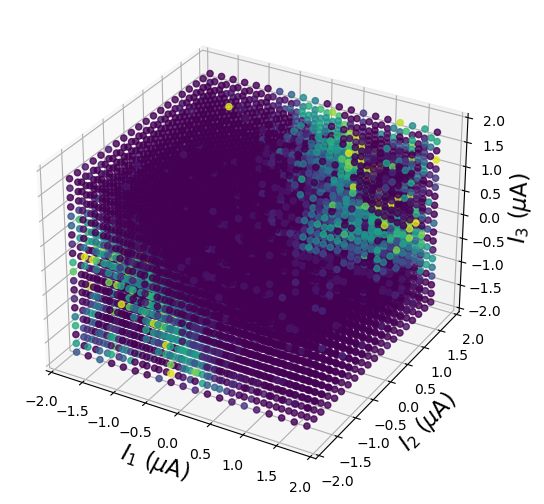

74 3
[[-6.82115673  1.50569254  2.3365052   1.10979633]
 [-6.57382187 -1.76842363 -2.53209987 -1.25694315]]
270


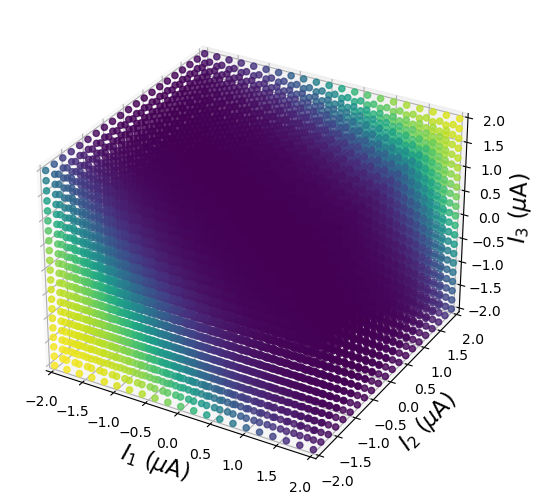

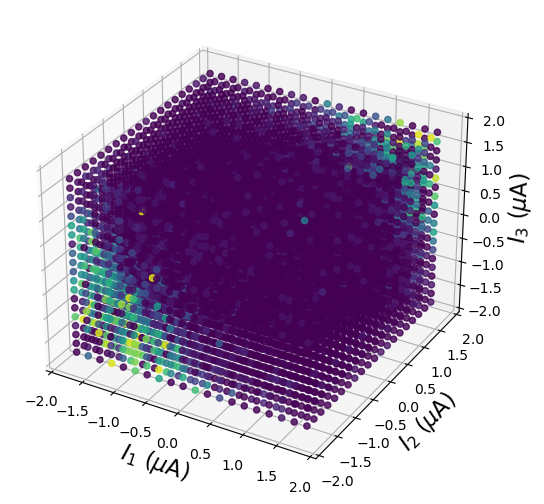

81 3
[[-11.2815839   -2.18499652  -2.45333562  -3.33483683]
 [-12.07821927   2.95854556   3.44816552   6.15141755]]
400


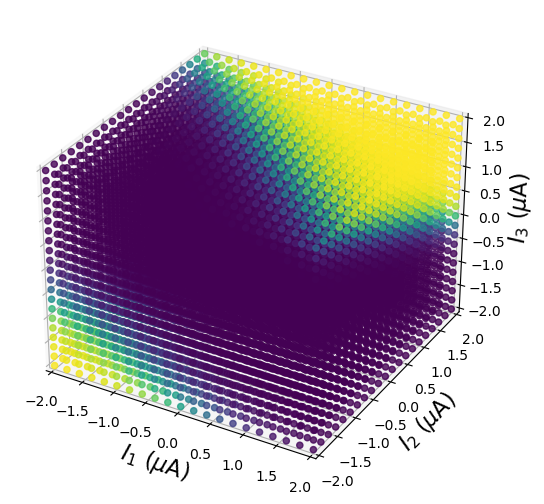

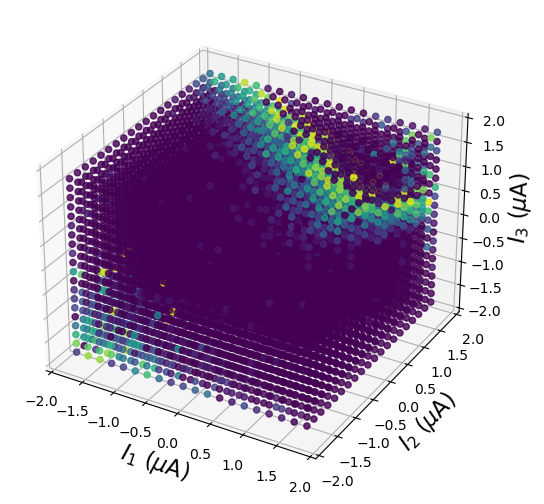

85 1
[[-21.79835811  10.           1.64658647   0.36552053]
 [-16.75034942 -10.          -1.05901277   0.74558617]]
315


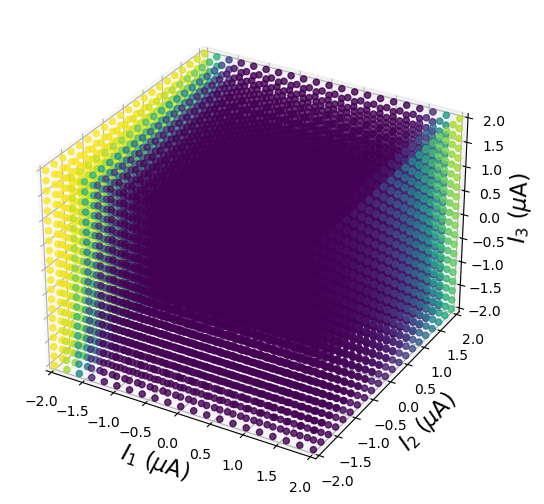

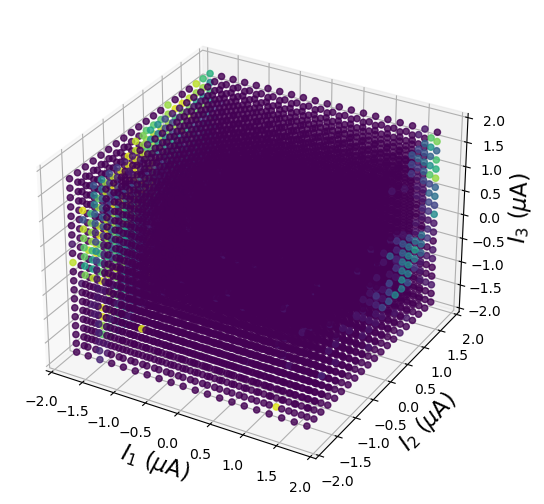

85 3
[[-8.06780981  3.09601347  1.26649035 10.        ]
 [-5.98518703 -0.114524    3.19303224 -4.33119375]
 [-9.65247013 -0.03481284 -5.47250574  3.74112621]
 [-5.98518703 -1.96390133 -2.33453272 -6.10117147]]
739


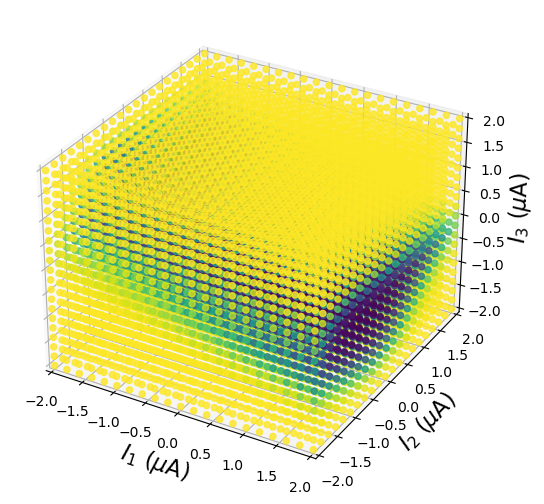

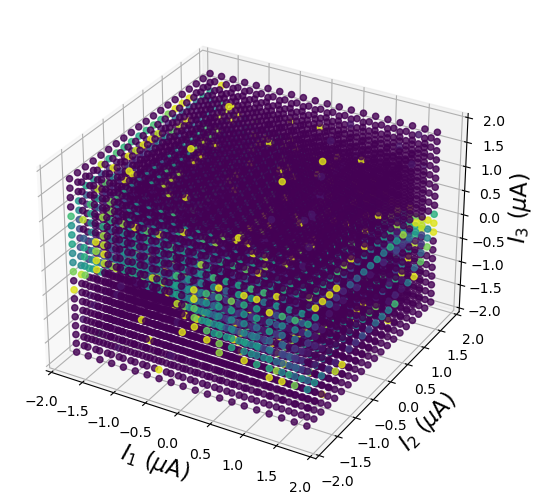

89 1
[[-1.70285689e+01  1.42318411e-02 -1.00000000e+01 -1.31698430e+00]
 [-1.76228525e+01  1.29510025e+00  7.93517157e+00  2.21951285e+00]]
353


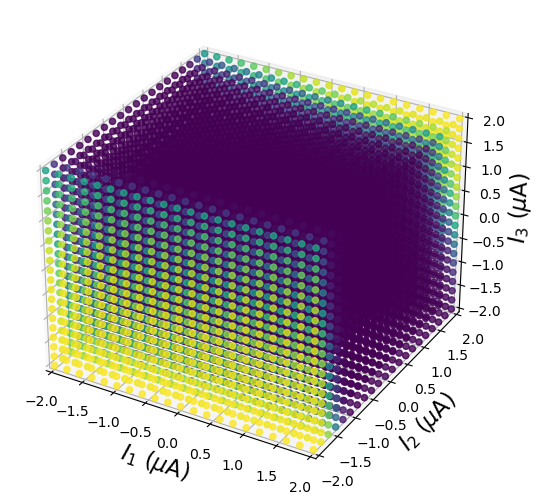

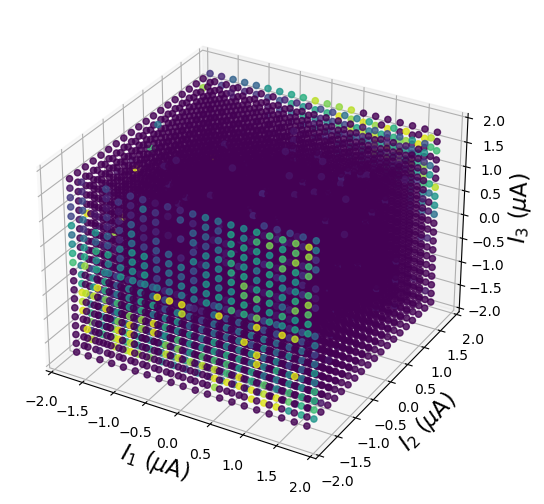

107 1
[[-5.55896626  2.78950162  1.02440647  1.09623731]
 [-5.94154183 -3.53746719 -1.21501769 -1.17177966]]
829


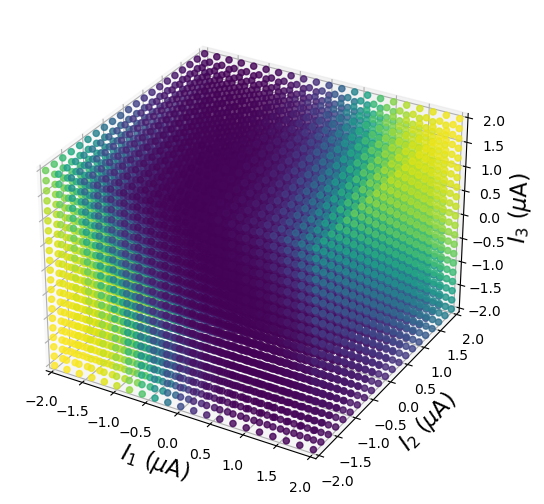

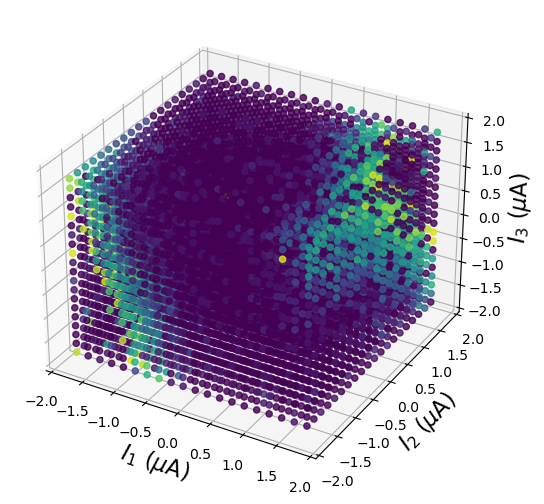

292 2
[[-12.19540154   4.19902175   0.847393     3.0511576 ]
 [-13.57815172  -5.39594107  -0.63741719  -3.883577  ]]
307


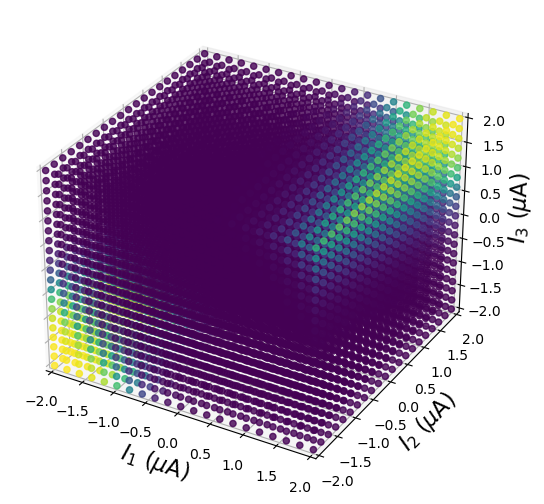

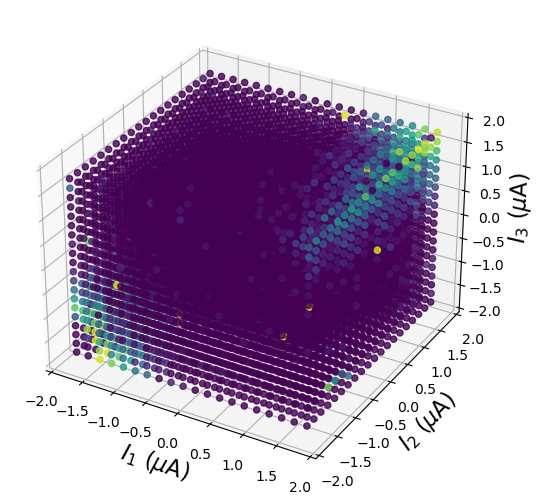

In [9]:
# CHECK DATASET IF NEEDED
from mpl_toolkits.mplot3d import Axes3D

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if ~np.all(params_true[i][j][:, 0] == -np.inf):

            print(cells[i], j+1)
            print(params_true[i][j])
            print(len(np.where(all_probs[i][j][clean_inds_array[i][j]] >= spont_limit)[0]))
            
            fig = plt.figure(0)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-2, 2)
            plt.ylim(-2, 2)
            ax.set_zlim(-2, 2)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_true_scan[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-2, 2)
            plt.ylim(-2, 2)
            ax.set_zlim(-2, 2)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps[j][:, 0], 
                              amps[j][:, 1],
                              amps[j][:, 2], marker='o', 
                              c=all_probs[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            # input()

Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(388441.06, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(417807.9, dtype=float32), DeviceArray(29366.838, dtype=float32))
1
(DeviceArray(361226.88, dtype=float32), DeviceArray(15504.33, dtype=float32), DeviceArray(395336.53, dtype=float32), DeviceArray(34109.656, dtype=float32))
2
(DeviceArray(350221.97, dtype=float32), DeviceArray(15317.283, dtype=float32), DeviceArray(380375.78, dtype=float32), DeviceArray(30153.81, dtype=float32))
3
(DeviceArray(334501.5, dtype=float32), DeviceArray(15011.088, dtype=float32), DeviceArray(358179.6, dtype=float32), DeviceArray(23678.104, dtype=float32))
4
(DeviceArray(318475.38, dtype=float32), DeviceArray(15059.969, dtype=float32), DeviceArray(343187.25, dtype=float32), DeviceArray(24711.88, dtype=float32))
5
(DeviceArray(303175.97, dtype=float32), DeviceArray(14938.162, dtype=float32), DeviceArray(325311.78, dtype=float32), DeviceAr

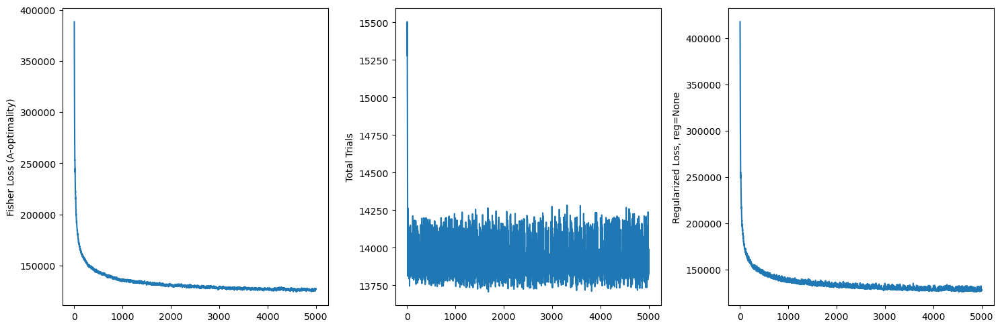

0.06390650082599907 0.06390650082599907


/tmp/ipykernel_3549/313770848.py:173: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(99770.32, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(106871.72, dtype=float32), DeviceArray(7101.399, dtype=float32))
1
(DeviceArray(97832.39, dtype=float32), DeviceArray(15438.896, dtype=float32), DeviceArray(105746.05, dtype=float32), DeviceArray(7913.6533, dtype=float32))
2
(DeviceArray(96159.44, dtype=float32), DeviceArray(15173.713, dtype=float32), DeviceArray(102716.9, dtype=float32), DeviceArray(6557.4585, dtype=float32))
3
(DeviceArray(94658.96, dtype=float32), DeviceArray(14728.275, dtype=float32), DeviceArray(98938.375, dtype=float32), DeviceArray(4279.414, dtype=float32))
4
(DeviceArray(93277.4, dtype=float32), DeviceArray(14689.855, dtype=float32), DeviceArray(97360.33, dtype=float32), DeviceArray(4082.928, dtype=float32))
5
(DeviceArray(91985.36, dtype=float32), DeviceArray(14464.293, dtype=float32), DeviceArray(94914.72, dtype=float32), DeviceArray(292

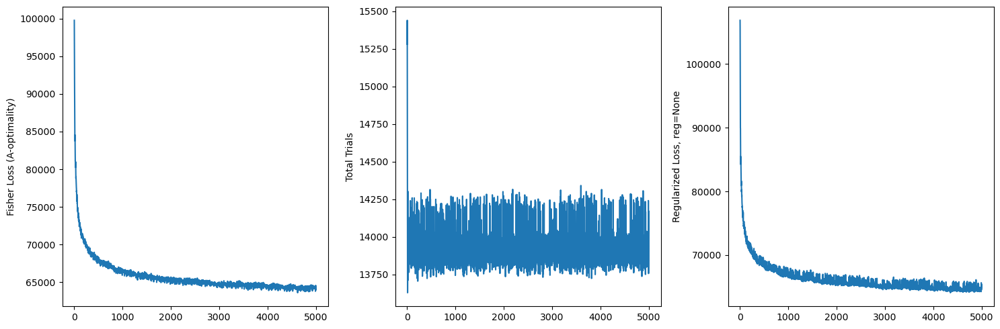

0.013201523678288668 0.15858557071676987


/tmp/ipykernel_3549/313770848.py:173: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(52689.035, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(56395.95, dtype=float32), DeviceArray(3706.9153, dtype=float32))
1
(DeviceArray(52252.01, dtype=float32), DeviceArray(15394.53, dtype=float32), DeviceArray(56264.484, dtype=float32), DeviceArray(4012.471, dtype=float32))
2
(DeviceArray(51934.25, dtype=float32), DeviceArray(15065.546, dtype=float32), DeviceArray(55068.47, dtype=float32), DeviceArray(3134.2185, dtype=float32))
3
(DeviceArray(51688.387, dtype=float32), DeviceArray(14545.226, dtype=float32), DeviceArray(53433.562, dtype=float32), DeviceArray(1745.1777, dtype=float32))
4
(DeviceArray(51484.867, dtype=float32), DeviceArray(14431.34, dtype=float32), DeviceArray(52926.016, dtype=float32), DeviceArray(1441.1498, dtype=float32))
5
(DeviceArray(51306.918, dtype=float32), DeviceArray(14128.586, dtype=float32), DeviceArray(51939.84, dtype=float32), DeviceArra

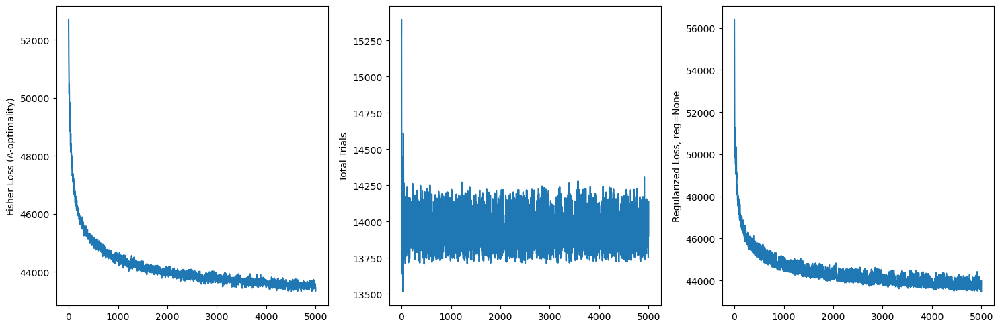

0.007587767553976499 0.14169918672020435


/tmp/ipykernel_3549/313770848.py:173: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(38039.816, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(40706.98, dtype=float32), DeviceArray(2667.165, dtype=float32))
1
(DeviceArray(37843.617, dtype=float32), DeviceArray(15364.947, dtype=float32), DeviceArray(40673.81, dtype=float32), DeviceArray(2830.1926, dtype=float32))
2
(DeviceArray(37731.562, dtype=float32), DeviceArray(14992.34, dtype=float32), DeviceArray(39846.05, dtype=float32), DeviceArray(2114.4895, dtype=float32))
3
(DeviceArray(37671.812, dtype=float32), DeviceArray(14419.564, dtype=float32), DeviceArray(38686.117, dtype=float32), DeviceArray(1014.30444, dtype=float32))
4
(DeviceArray(37643.355, dtype=float32), DeviceArray(14248.383, dtype=float32), DeviceArray(38328.855, dtype=float32), DeviceArray(685.4993, dtype=float32))
5
(DeviceArray(37633.85, dtype=float32), DeviceArray(13885.499, dtype=float32), DeviceArray(37645.38, dtype=float32), DeviceArr

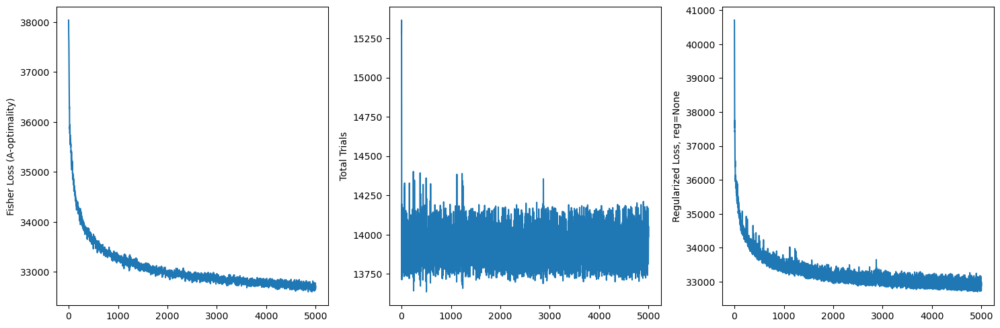

0.006833090033001247 0.06013555926532257


/tmp/ipykernel_3549/313770848.py:173: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(29545.32, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(31612.508, dtype=float32), DeviceArray(2067.1882, dtype=float32))
1
(DeviceArray(29445.492, dtype=float32), DeviceArray(15340.209, dtype=float32), DeviceArray(31602.207, dtype=float32), DeviceArray(2156.7146, dtype=float32))
2
(DeviceArray(29406.488, dtype=float32), DeviceArray(14932.287, dtype=float32), DeviceArray(30955.924, dtype=float32), DeviceArray(1549.4353, dtype=float32))
3
(DeviceArray(29405.787, dtype=float32), DeviceArray(14318.409, dtype=float32), DeviceArray(30041.334, dtype=float32), DeviceArray(635.5461, dtype=float32))
4
(DeviceArray(29426.844, dtype=float32), DeviceArray(14112.472, dtype=float32), DeviceArray(29755.807, dtype=float32), DeviceArray(328.96384, dtype=float32))
5
(DeviceArray(29460.387, dtype=float32), DeviceArray(13713.574, dtype=float32), DeviceArray(29725.268, dtype=float32), Devi

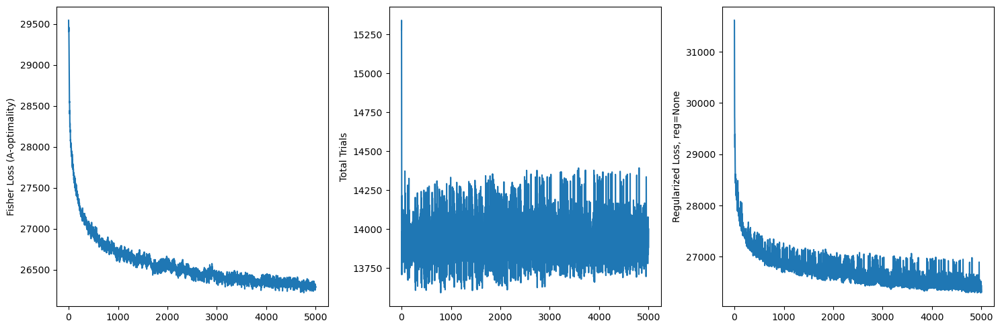

0.006120889843715113 0.01949014797743716


/tmp/ipykernel_3549/313770848.py:173: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(24136.02, dtype=float32), DeviceArray(15280.072, dtype=float32), DeviceArray(25822.436, dtype=float32), DeviceArray(1686.4165, dtype=float32))
1
(DeviceArray(24079.02, dtype=float32), DeviceArray(15321.598, dtype=float32), DeviceArray(25815.87, dtype=float32), DeviceArray(1736.8489, dtype=float32))
2
(DeviceArray(24067.695, dtype=float32), DeviceArray(14888.171, dtype=float32), DeviceArray(25278.148, dtype=float32), DeviceArray(1210.4535, dtype=float32))
3
(DeviceArray(24084.486, dtype=float32), DeviceArray(14245.818, dtype=float32), DeviceArray(24514.805, dtype=float32), DeviceArray(430.31848, dtype=float32))
4
(DeviceArray(24116.523, dtype=float32), DeviceArray(14018.727, dtype=float32), DeviceArray(24271.04, dtype=float32), DeviceArray(154.51625, dtype=float32))
5
(DeviceArray(24155.83, dtype=float32), DeviceArray(13599.486, dtype=float32), DeviceArray(24510.48, dtype=float32), DeviceAr

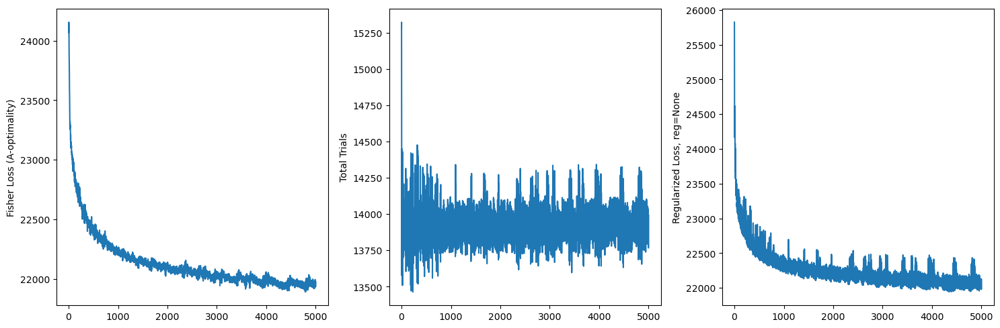

0.005494380624419283 0.016120841377714735


In [10]:

# total_budget = 50000
num_iters = 5

T_prev = np.zeros((amps_scan.shape[0], amps_scan.shape[1]), dtype=float)
budget = T_prev.shape[0] * T_prev.shape[1] * 0.5 #int(total_budget / num_iters)
reg = None # 20, 50
T_step_size = 0.05 # 0.05, 0.01
T_n_steps = 5000    # 5000

init_trials = 5
init_amps = 200
ms = [1, 2, 3, 4, 5, 6]
disambiguate = False
verbose = True
R2_cutoff = 0
prob_low = 1 / init_trials
min_inds = 20

for i in range(len(T_prev)):
    init_inds = np.random.choice(np.arange(len(T_prev[i]), dtype=int), size=init_amps,
                                 replace=False)
    T_prev[i][init_inds] = init_trials

# T_prev[:, np.where(np.count_nonzero(amps_scan[0], axis=1) <= 1)[0]] = init_trials
T_prev_uniform = deepcopy(T_prev)

probs_empirical = sample_spikes_array(probs_true_scan, T_prev, NUM_THREADS=24)
probs_empirical_uniform = deepcopy(probs_empirical)

performances = []
performances_uniform = []
num_samples = []
num_samples_uniform = []

iter_cnt = 0
while True:
    if iter_cnt == 0:
        T_new, w_inits_array, t_final, probs_curr, params_curr = fitting.fisher_sampling_1elec(
                                        probs_empirical, 
                                        T_prev, amps_scan,
                                        T_step_size=T_step_size,
                                        T_n_steps=T_n_steps,
                                        verbose=verbose, budget=budget, ms=ms, reg=reg,
                                        return_probs=True,
                                        disambiguate=disambiguate,
                                        R2_cutoff=R2_cutoff,
                                        min_prob=prob_low,
                                        min_inds=min_inds)

        performance = get_performance_array(params_true, probs_curr, probs_true_scan)
        performance_uniform = performance

        w_inits_array_uniform = deepcopy(w_inits_array)
        
    else:
        T_new, w_inits_array, t_final, probs_curr, params_curr = fitting.fisher_sampling_1elec(
                                        probs_empirical, 
                                        T_prev, amps_scan,
                                        T_step_size=T_step_size,
                                        T_n_steps=T_n_steps,
                                        verbose=verbose, budget=budget, ms=ms, reg=reg,
                                        return_probs=True,
                                        # t_final=t_final,
                                        w_inits_array=w_inits_array,
                                        disambiguate=disambiguate,
                                        R2_cutoff=R2_cutoff,
                                        min_prob=prob_low,
                                        min_inds=min_inds)
        
        performance = get_performance_array(params_true, probs_curr, probs_true_scan)

        input_list_uniform = fitting.generate_input_list(probs_empirical_uniform, amps_scan, 
                                                            T_prev_uniform, w_inits_array_uniform, prob_low,
                                                            disambiguate=disambiguate, min_inds=min_inds)

        pool = mp.Pool(processes=24)
        results_uniform = pool.starmap_async(fitting.fit_surface, input_list_uniform)
        mp_output_uniform = results_uniform.get()
        pool.close()

        params_curr_uniform = np.zeros((probs_empirical_uniform.shape[0], probs_empirical_uniform.shape[1]), dtype=object)
        w_inits_array_uniform = np.zeros((probs_empirical_uniform.shape[0], probs_empirical_uniform.shape[1]), dtype=object)
        probs_curr_uniform = np.zeros(probs_empirical_uniform.shape)

        cnt = 0
        for i in range(len(probs_empirical_uniform)):
            for j in range(len(probs_empirical_uniform[i])):
                params_curr_uniform[i][j] = mp_output_uniform[cnt][0]
                w_inits_array_uniform[i][j] = mp_output_uniform[cnt][1]
                
                probs_curr_uniform[i][j] = fitting.sigmoidND_nonlinear(
                                        sm.add_constant(amps_scan[j], has_constant='add'), 
                                        params_curr_uniform[i][j])

                cnt += 1

        performance_uniform = get_performance_array(params_true, probs_curr_uniform, probs_true_scan)
    
    # for i in range(len(all_probs)):
    #     for j in range(len(all_probs[i])):
    #         if ~np.all(params_true[i][j][:, 0] == -np.inf):

    #             sampled_inds = np.where(T_prev[j] > 0)[0]
    #             print(cells[i], j+1)
    #             print(params_true[i][j])
    #             print(len(np.where(all_probs[i][j][clean_inds_array[i][j]] >= spont_limit)[0]))
                
    #             fig = plt.figure(0)
    #             fig.clear()
    #             ax = Axes3D(fig, auto_add_to_figure=False)
    #             fig.add_axes(ax)
    #             plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    #             plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    #             plt.xlim(-2, 2)
    #             plt.ylim(-2, 2)
    #             ax.set_zlim(-2, 2)
    #             ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

    #             scat = ax.scatter(amps_scan[j][:, 0], 
    #                             amps_scan[j][:, 1],
    #                             amps_scan[j][:, 2], marker='o', 
    #                             c=probs_true_scan[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
    #             plt.show()

    #             fig = plt.figure(1)
    #             fig.clear()
    #             ax = Axes3D(fig, auto_add_to_figure=False)
    #             fig.add_axes(ax)
    #             plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    #             plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    #             plt.xlim(-2, 2)
    #             plt.ylim(-2, 2)
    #             ax.set_zlim(-2, 2)
    #             ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

    #             scat = ax.scatter(amps_scan[j][:, 0], 
    #                             amps_scan[j][:, 1],
    #                             amps_scan[j][:, 2], marker='o', 
    #                             c=probs_curr[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
    #             plt.show()

    #             fig = plt.figure(2)
    #             fig.clear()
    #             ax = Axes3D(fig, auto_add_to_figure=False)
    #             fig.add_axes(ax)
    #             plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
    #             plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
    #             plt.xlim(-2, 2)
    #             plt.ylim(-2, 2)
    #             ax.set_zlim(-2, 2)
    #             ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

    #             scat = ax.scatter(amps_scan[j][sampled_inds, 0], 
    #                             amps_scan[j][sampled_inds, 1],
    #                             amps_scan[j][sampled_inds, 2], marker='o', 
    #                             c=probs_empirical[i][j][sampled_inds], s=20, alpha=0.8, vmin=0, vmax=1)
    #             plt.show()

    print(performance, performance_uniform)
    
    performances.append(performance)
    performances_uniform.append(performance_uniform)
    
    num_samples.append(np.sum(T_prev))
    num_samples_uniform.append(np.sum(T_prev_uniform))

    iter_cnt += 1

    if iter_cnt > num_iters:
        break

    p_new = sample_spikes_array(probs_true_scan, T_new, NUM_THREADS=24)
    p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])
    T_tmp = T_new + T_prev

    p_tmp = np.nan_to_num(p_tmp, nan=0.5)

    probs_empirical = p_tmp
    T_prev = T_tmp
    
    # random_extra = np.random.choice(len(T_new.flatten()), size=int(np.sum(T_new)), replace=True)
    # T_new_uniform = np.array(np.bincount(random_extra, minlength=len(T_new.flatten())).astype(int).reshape(T_new.shape), dtype=float)
    T_new_uniform = np.ones_like(T_prev_uniform, dtype=float)
    p_new_uniform = sample_spikes_array(probs_true_scan, T_new_uniform, NUM_THREADS=24)

    p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])
    T_tmp_uniform = T_prev_uniform + T_new_uniform

    p_tmp_uniform = np.nan_to_num(p_tmp_uniform, nan=0.5)

    probs_empirical_uniform = p_tmp_uniform
    T_prev_uniform = T_tmp_uniform

In [11]:
baseline_trials = 20
T_prev_baseline = np.ones_like(T_prev, dtype=float) * baseline_trials

probs_empirical_baseline = sample_spikes_array(probs_true_scan, T_prev_baseline, NUM_THREADS=24)

w_inits_array_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
for i in range(len(w_inits_array_baseline)):
    for j in range(len(w_inits_array_baseline[i])):
        w_inits = []

        for m in ms:
            w_init = np.array(np.random.normal(size=(m, amps_scan[j].shape[1]+1)))
            w_inits.append(w_init)

        w_inits_array_baseline[i][j] = w_inits

input_list_baseline = fitting.generate_input_list(probs_empirical_baseline, amps_scan, T_prev_baseline, w_inits_array_baseline, 1 / baseline_trials,
                                                    disambiguate=disambiguate, min_inds=min_inds)

pool = mp.Pool(processes=24)
results_baseline = pool.starmap_async(fitting.fit_surface, input_list_baseline)
mp_output_baseline = results_baseline.get()
pool.close()

params_curr_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
w_inits_array_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
probs_curr_baseline = np.zeros(probs_empirical_baseline.shape)

cnt = 0
for i in range(len(probs_empirical_baseline)):
    for j in range(len(probs_empirical_baseline[i])):
        params_curr_baseline[i][j] = mp_output_baseline[cnt][0]
        w_inits_array_baseline[i][j] = mp_output_baseline[cnt][1]
        
        probs_curr_baseline[i][j] = fitting.sigmoidND_nonlinear(
                                sm.add_constant(amps_scan[j], has_constant='add'), 
                                params_curr_baseline[i][j])

        cnt += 1

performance_baseline = get_performance_array(params_true, probs_curr_baseline, probs_true_scan)

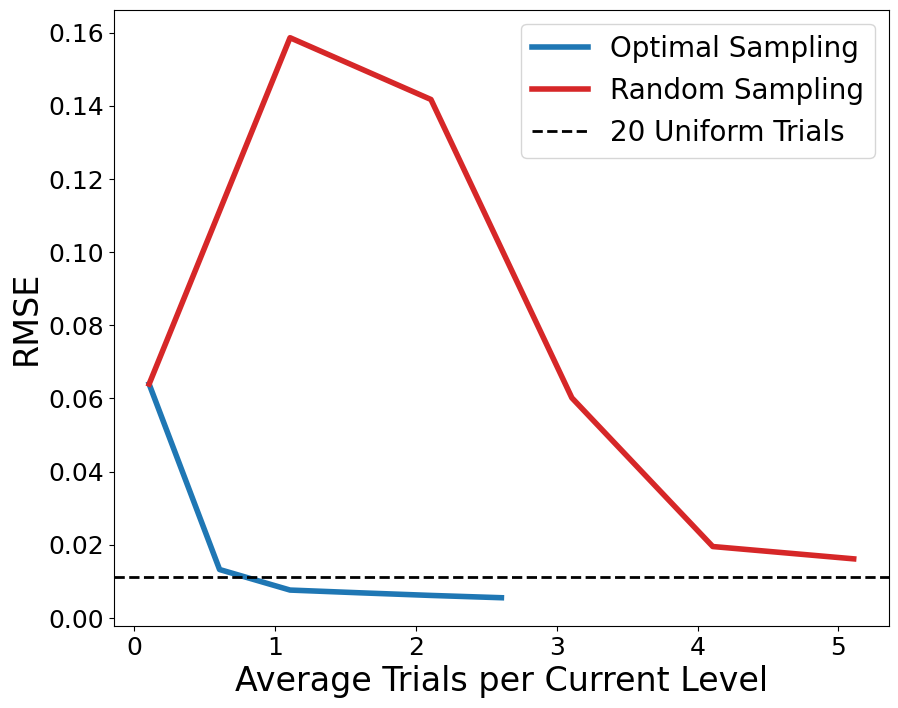

In [12]:
plt.figure(figsize=(10, 8))

plt.plot(np.array(num_samples)/T_prev.shape[0]/T_prev.shape[1], performances, linewidth=4, c='tab:blue', label='Optimal Sampling')
plt.plot(np.array(num_samples_uniform)/T_prev_uniform.shape[0]/T_prev_uniform.shape[1], performances_uniform, linewidth=4, c='tab:red', label='Random Sampling')

plt.axhline(performance_baseline, c='k', linestyle='--', linewidth=2, label=f'{baseline_trials} Uniform Trials')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Average Trials per Current Level', fontsize=24)
plt.ylabel(r'RMSE', fontsize=24)
plt.legend(fontsize=20)

# plt.savefig(f'triplet_AL_full_{dataset}.png', dpi=300)

6 2
[[-9.75079214  1.78470369  1.51253399  6.56807978]
 [-8.87068147 -1.76451543 -1.47130969 -7.32618583]]
850


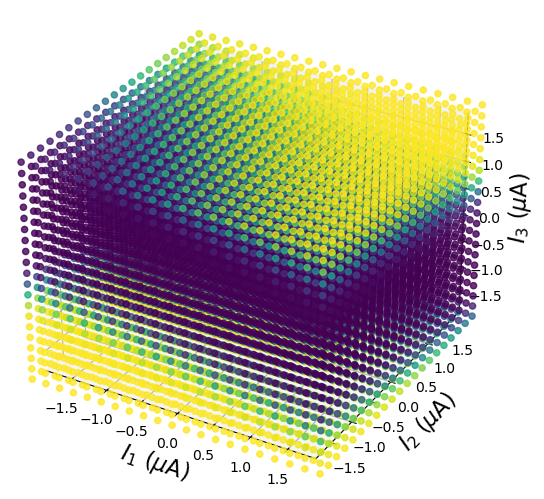

[[-10.03571469   1.79353457   1.5742635    6.73055661]
 [ -8.88556109  -1.78658486  -1.46420605  -7.36982568]]


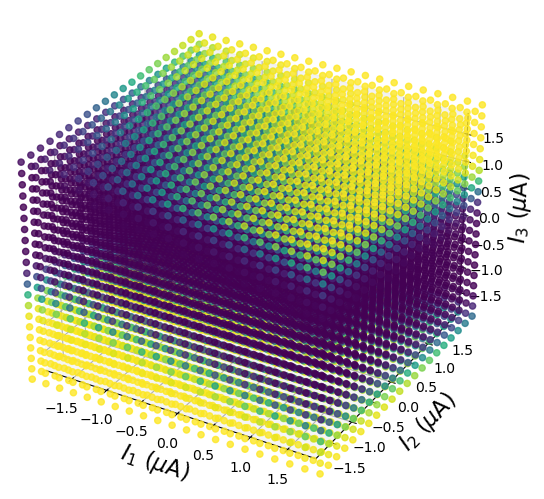

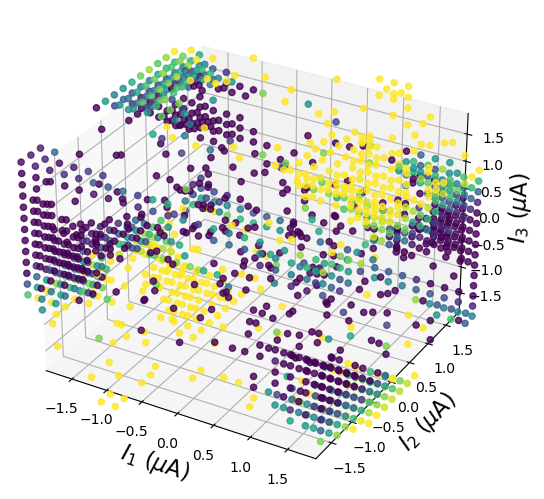

KeyboardInterrupt: Interrupted by user

In [13]:
# CHECK DATASET IF NEEDED
from mpl_toolkits.mplot3d import Axes3D

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if ~np.all(params_true[i][j][:, 0] == -np.inf):

            print(cells[i], j+1)
            print(params_true[i][j])
            print(len(np.where(all_probs[i][j][clean_inds_array[i][j]] >= spont_limit)[0]))

            sampled_inds = np.where(T_prev[j] > 0)[0]
            
            fig = plt.figure(0)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_true_scan[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()


            print(params_curr[i][j])
            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_curr[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][sampled_inds, 0], 
                              amps_scan[j][sampled_inds, 1],
                              amps_scan[j][sampled_inds, 2], marker='o', 
                              c=probs_empirical[i][j][sampled_inds], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            input()